# Duke PAM Project - Undersampled PAM
## Title: Showing Example Usage of Downsampling Methods
## Author: Anthony DiSpirito III
## Github: @axd465
## Date: November 20, 2020

### pip installs/uninstalls

In [1]:
# !pip3 uninstall tensorflow_datasets -y -q
# !pip3 install git+git://github.com/axd465/datasets -q

### Import Statements

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
import os
import shutil
from functools import partial
from tensorflow.image import random_crop, random_brightness, random_contrast, \
                             random_flip_left_right, random_flip_up_down, resize
if os.path.basename(os.getcwd()) == 'examples':
    os.chdir('../')
from utils.gdrive_utils import download_file_from_gdrive
from utils.model_utils import SSIM
from utils.model_utils import PSNR
from utils.downsampling_utils import *

%matplotlib inline
%load_ext autoreload
%autoreload 2
AUTOTUNE = os.cpu_count()//2 #tf.data.experimental.AUTOTUNE
print('Tensorflow version: ' + tf.__version__)

Tensorflow version: 2.3.1


In [2]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


## Load Dataset

In [3]:
(train_ds, val_ds), metadata = tfds.load('duke_pam/clean', split=['train', 'validation'], with_info=True, data_dir = 'data')

### Picking Downsampling Method

In [4]:
DOWNSAMPLING_METHOD = 'uniform' # 'uniform' or 'random'
SPARSITY = 1 - (1/9)
DOWN_RATIO = (3,3)
CROP_SIZE = (128, 128, 3)
SAVE_OUTPUT = False
FIG_DIR = 'figures'

In [5]:
if DOWNSAMPLING_METHOD is 'random':
    down_map_func = partial(downsample_zerofill, sparsity=SPARSITY, min_shape = (CROP_SIZE[0], CROP_SIZE[1]))
    train_ds_down_zerofill_rand = train_ds.map(lambda x: tf.numpy_function(down_map_func, [x['image']], tf.float32), num_parallel_calls=AUTOTUNE).cache()
    val_ds_down_zerofill_rand = val_ds.map(lambda x: tf.numpy_function(down_map_func, [x['image']], tf.float32), num_parallel_calls=AUTOTUNE).cache()
else:
    down_map_func = partial(downsample_zerofill, down_ratio=DOWN_RATIO, min_shape = (CROP_SIZE[0], CROP_SIZE[1]))
    train_ds_down_zerofill = train_ds.map(lambda x: tf.numpy_function(down_map_func, [x['image']], tf.float32), num_parallel_calls=AUTOTUNE).cache()
    val_ds_down_zerofill = val_ds.map(lambda x: tf.numpy_function(down_map_func, [x['image']], tf.float32), num_parallel_calls=AUTOTUNE).cache()

## Load Model

### Download Trained Models From Google Drive

In [ ]:
fileid="1-d_-4towTGNhMTmG2bq59Vp4adznMABu"
filename="trained_models.zip"
download_file_from_gdrive(fileid, filename)
!apt-get -qq install unzip
!unzip -qq $filename && rm $filename

### Load Pretrained Models

In [6]:
if DOWNSAMPLING_METHOD is 'random':
    input_dir = f'saved_unet_rand_down_{int(np.round(SPARSITY*100))}p'
else:
    input_dir = f'saved_unet_uni_down_{DOWN_RATIO[0]}_{DOWN_RATIO[1]}'
best_model_dir = os.path.join(input_dir, 'best_models')
file_list = [file for file in os.listdir(best_model_dir) if os.path.isfile(os.path.join(best_model_dir, file))]
filename = sorted(file_list, key = lambda x : int(x.partition('h_')[2].partition('-')[0]))[-1]
path = os.path.join(best_model_dir, filename)
print('Loading Model...')
model = tf.keras.models.load_model(path, custom_objects={'SSIM':SSIM, 'PSNR':PSNR})
print('Done!!!')

Loading Model...
Done!!!


In [7]:
# Create Figures Directory:
if not os.path.exists(FIG_DIR):
    print('Creating Directory...')
    os.mkdir(FIG_DIR)
else:
    print('Directory Already Exists...')
print('Done!!!')

Directory Already Exists...
Done!!!


## Uniform Downsampling Tests

(1200, 2000, 3)
(1216, 2016, 3)
MAE: 0.03235048055648804
MSE: 0.0031482677441090345
SSIM: 0.7930818796157837
PSNR: 24.794971466064453


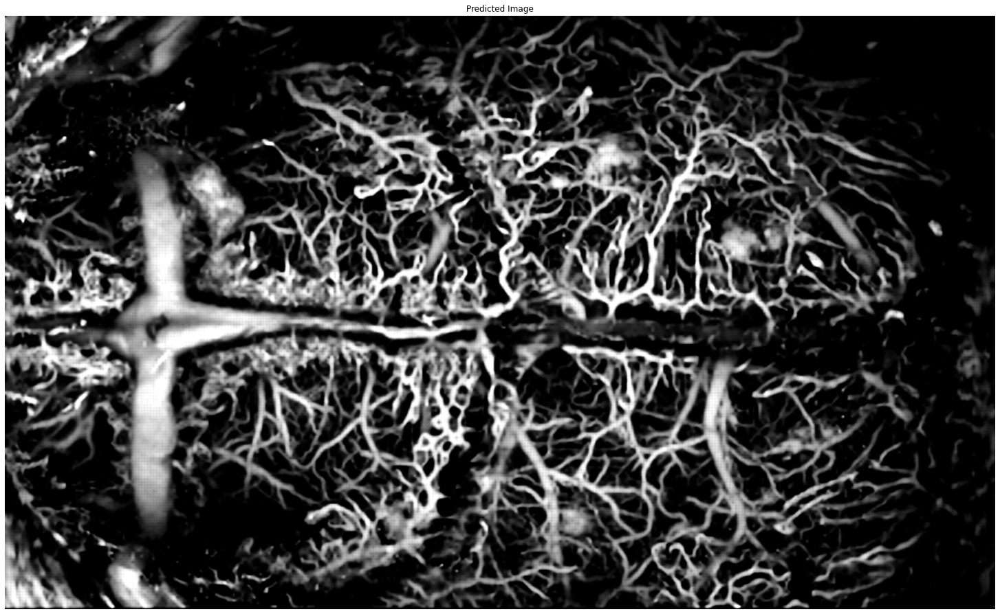

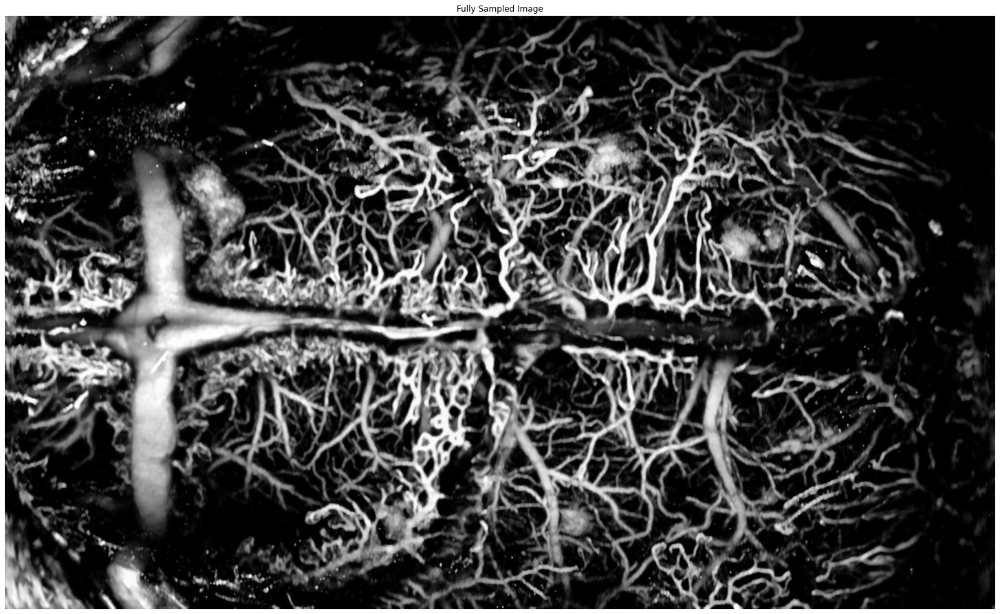

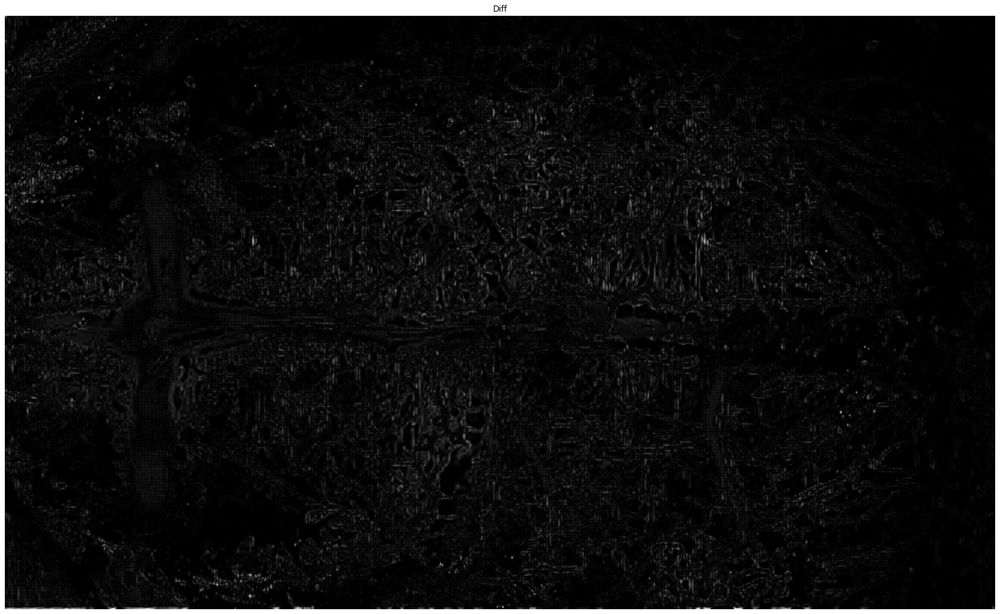

In [8]:
if DOWNSAMPLING_METHOD is 'uniform':
    img = next(iter(val_ds_down_zerofill.shuffle(10000, seed=25)))
    fig_dir = os.path.join(FIG_DIR, input_dir)

    print(img.shape)
    orig_img = tf.pad(img, [[0, (np.ceil(img.shape[0]/32)*32 - img.shape[0]).astype(np.int32)], 
                            [0, (np.ceil(img.shape[1]/32)*32 - img.shape[1]).astype(np.int32)], 
                            [0,0]], "CONSTANT")
    print(orig_img.shape)
    pred = model.predict(orig_img[...,1][None,...,None])[0,...]
    pred = tf.image.crop_to_bounding_box(pred, 0, 0, img.shape[0], img.shape[1])
    pred = tf.clip_by_value(pred, 0, 1)
    orig_img = tf.image.crop_to_bounding_box(orig_img, 0, 0, img.shape[0], img.shape[1])

    print(f'MAE: {np.mean(np.abs(pred[...,0] - orig_img[...,0]))}')
    print(f'MSE: {np.mean((pred[...,0] - orig_img[...,0])**2)}')
    print(f'SSIM: {SSIM(pred[...,0][...,None], orig_img[...,0][...,None])}')
    print(f'PSNR: {PSNR(pred[...,0][...,None], orig_img[...,0][...,None])}')

    figsize = (20,20)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(pred[...,0], cmap = 'gray')
    if SAVE_OUTPUT: plt.savefig(fig_dir+'_pred_img.png', dpi=300, bbox_inches='tight',transparent=True, pad_inches=0)
    plt.title('Predicted Image')
    plt.show()
    figsize = (20,20)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(orig_img[...,0], cmap = 'gray')
    if SAVE_OUTPUT: plt.savefig(fig_dir+'_full_img.png', dpi=300, bbox_inches='tight',transparent=True, pad_inches=0)
    plt.title('Fully Sampled Image')
    plt.show()
    figsize = (20,20)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(np.abs(orig_img[...,0] - pred[...,0]), cmap = 'gray')
    if SAVE_OUTPUT: plt.savefig(fig_dir+'_diff_img.png', dpi=300, bbox_inches='tight',transparent=True, pad_inches=0)
    plt.title('Diff')
    plt.show()

(1200, 1400, 3)
(1216, 1408, 3)
MAE: 0.021022189408540726
MSE: 0.002545675029978156
SSIM: 0.4761658012866974
PSNR: 20.51156997680664


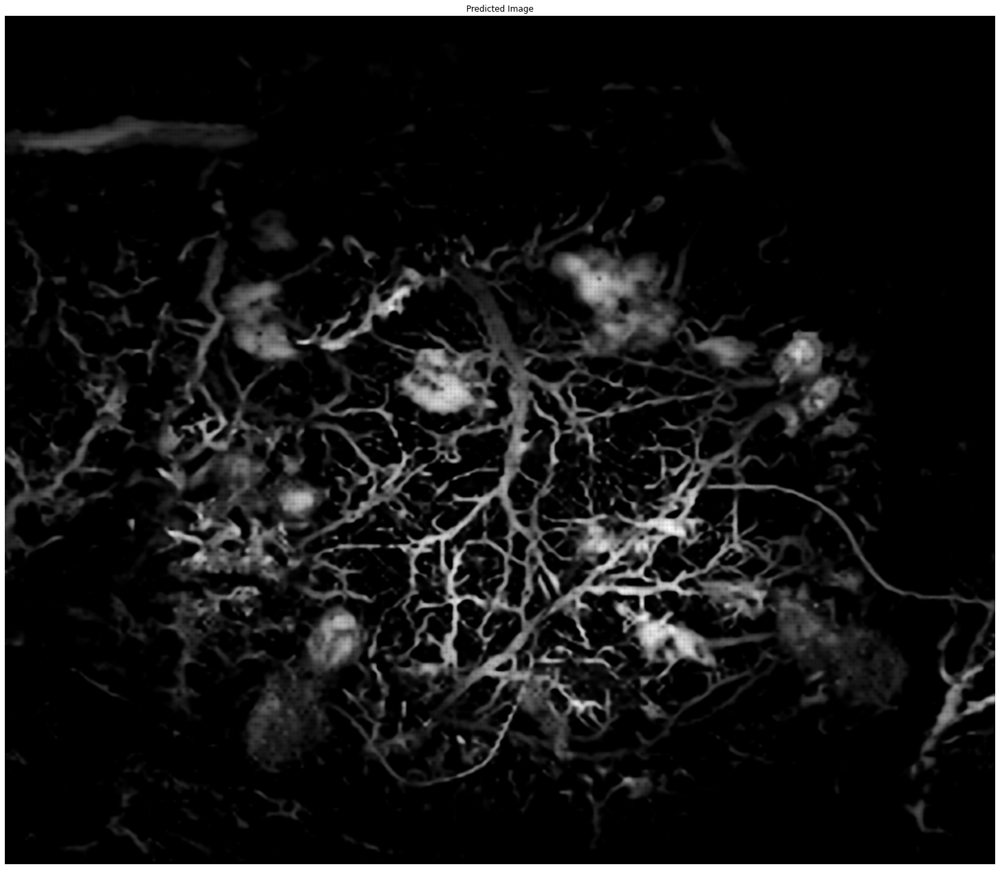

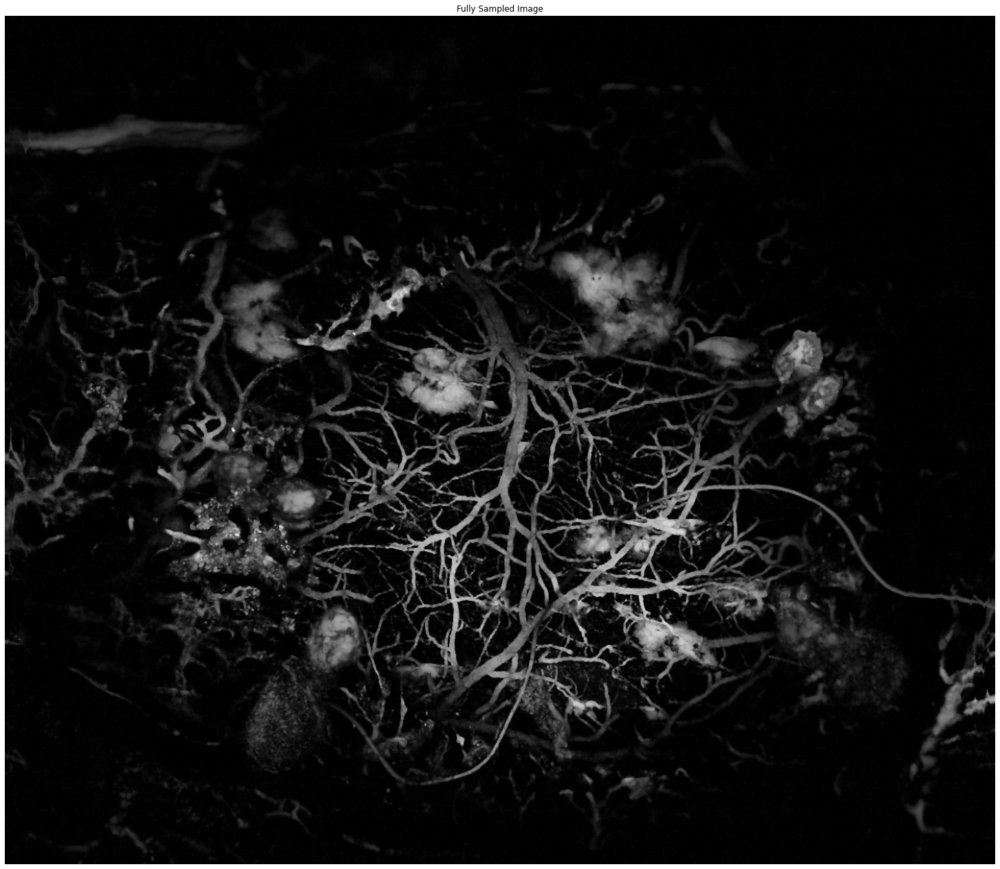

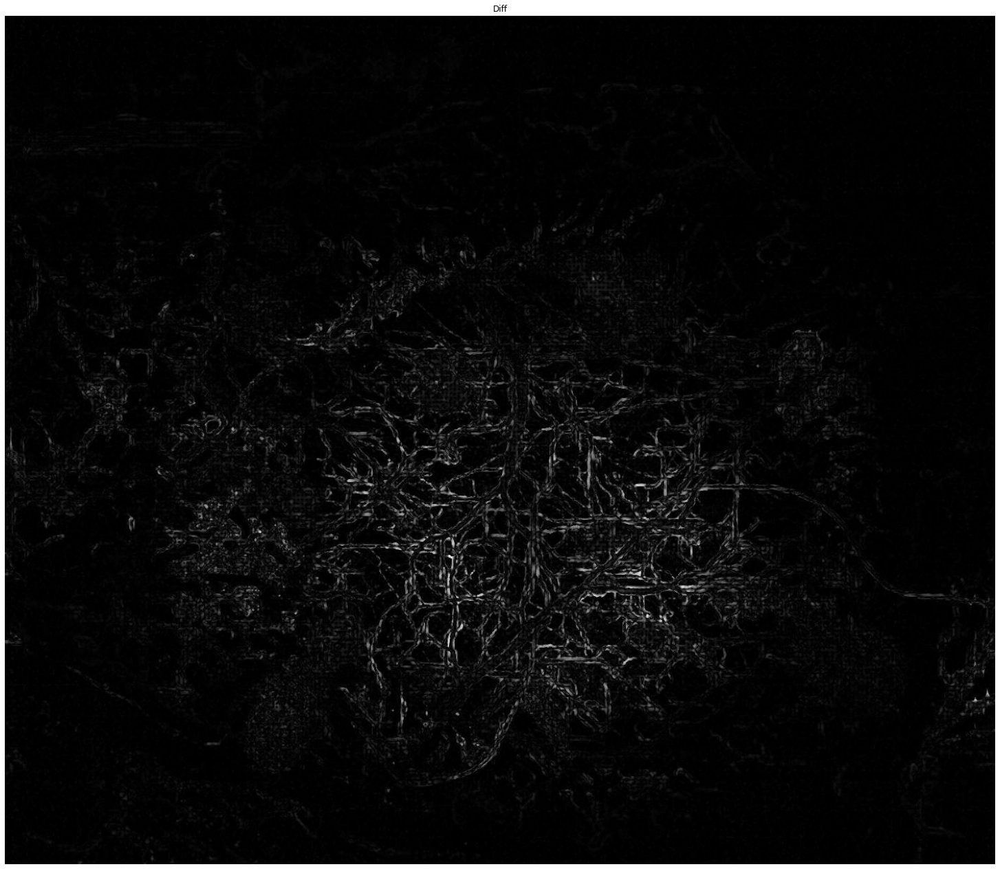

In [9]:
if DOWNSAMPLING_METHOD is 'uniform':
    img = next(iter(val_ds_down_zerofill.shuffle(10000, seed=28)))
    fig_dir = os.path.join(FIG_DIR, input_dir)

    print(img.shape)
    orig_img = tf.pad(img, [[0, (np.ceil(img.shape[0]/32)*32 - img.shape[0]).astype(np.int32)], 
                            [0, (np.ceil(img.shape[1]/32)*32 - img.shape[1]).astype(np.int32)], 
                            [0,0]], "CONSTANT")
    print(orig_img.shape)
    pred = model.predict(orig_img[...,1][None,...,None])[0,...]
    pred = tf.image.crop_to_bounding_box(pred, 0, 0, img.shape[0], img.shape[1])
    pred = tf.clip_by_value(pred, 0, 1)
    orig_img = tf.image.crop_to_bounding_box(orig_img, 0, 0, img.shape[0], img.shape[1])

    print(f'MAE: {np.mean(np.abs(pred[...,0] - orig_img[...,0]))}')
    print(f'MSE: {np.mean((pred[...,0] - orig_img[...,0])**2)}')
    print(f'SSIM: {SSIM(pred[...,0][...,None], orig_img[...,0][...,None])}')
    print(f'PSNR: {PSNR(pred[...,0][...,None], orig_img[...,0][...,None])}')

    figsize = (20,20)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(pred[...,0], cmap = 'gray')
    if SAVE_OUTPUT: plt.savefig(fig_dir+'_pred_img_2.png', dpi=300, bbox_inches='tight',transparent=True, pad_inches=0)
    plt.title('Predicted Image')
    plt.show()
    figsize = (20,20)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(orig_img[...,0], cmap = 'gray')
    if SAVE_OUTPUT: plt.savefig(fig_dir+'_full_img_2.png', dpi=300, bbox_inches='tight',transparent=True, pad_inches=0)
    plt.title('Fully Sampled Image')
    plt.show()
    figsize = (20,20)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(np.abs(orig_img[...,0] - pred[...,0]), cmap = 'gray')
    if SAVE_OUTPUT: plt.savefig(fig_dir+'_diff_img_2.png', dpi=300, bbox_inches='tight',transparent=True, pad_inches=0)
    plt.title('Diff')
    plt.show()

## Random Sampling Tests

(1200, 2000, 3)
(1216, 2016, 3)
MAE: 0.04490873962640762
MSE: 0.00647208234295249
SSIM: 0.7435243725776672
PSNR: 21.52914810180664


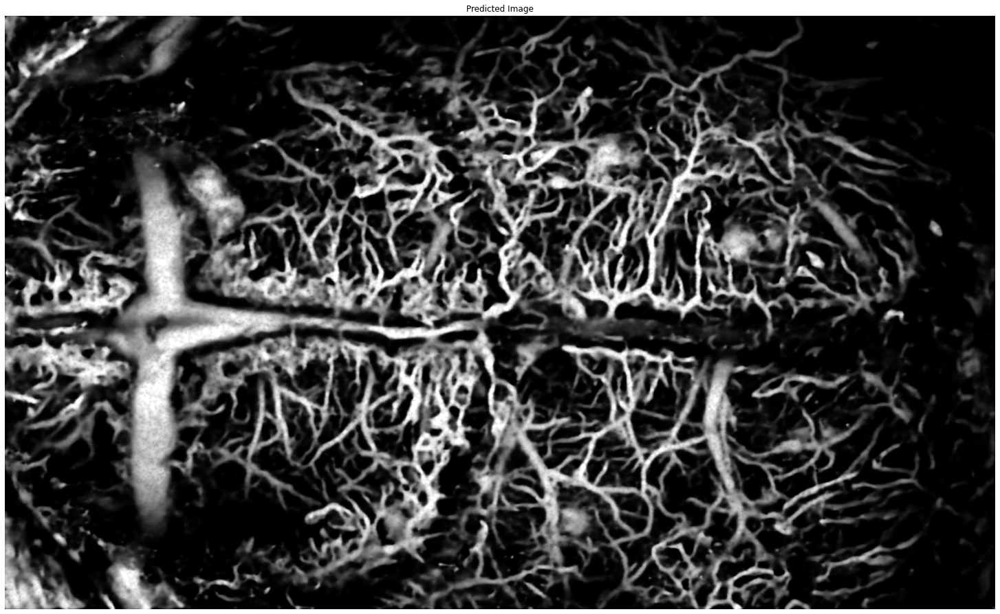

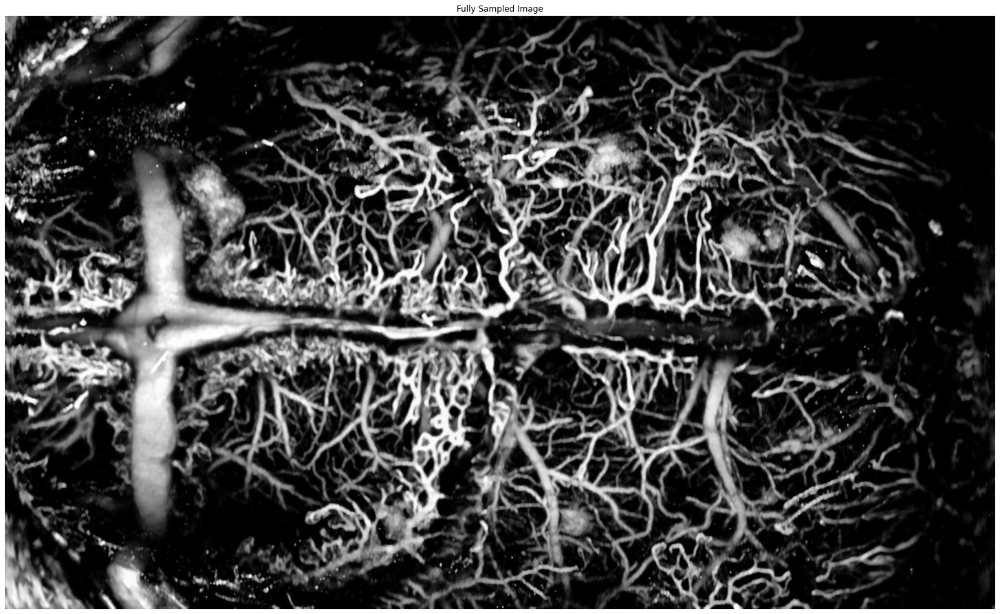

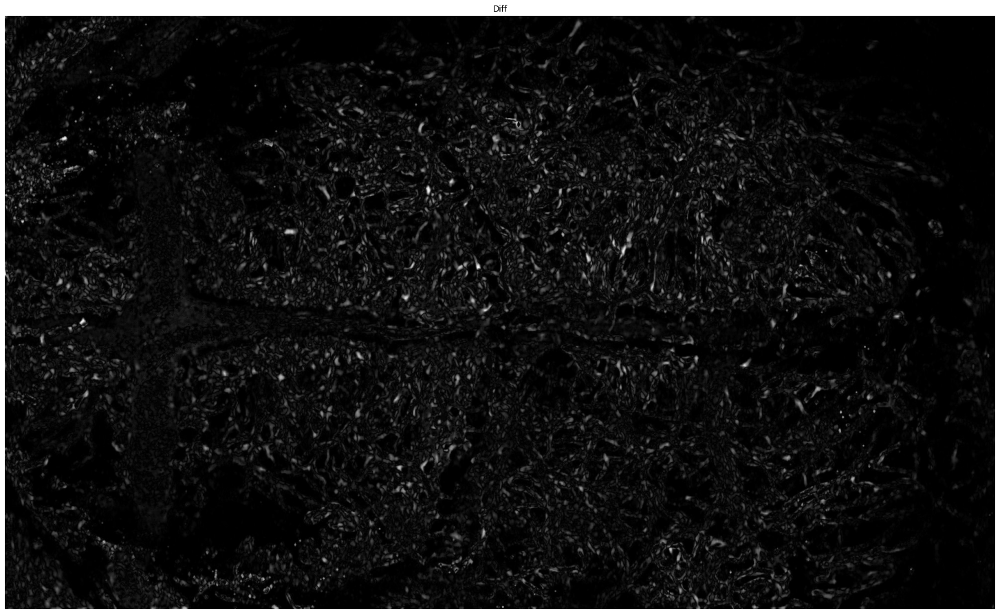

In [8]:
if DOWNSAMPLING_METHOD is 'random':
    img = next(iter(val_ds_down_zerofill_rand.shuffle(10000, seed=25)))
    fig_dir = os.path.join(FIG_DIR, input_dir)

    print(img.shape)
    orig_img = tf.pad(img, [[0, (np.ceil(img.shape[0]/32)*32 - img.shape[0]).astype(np.int32)], 
                            [0, (np.ceil(img.shape[1]/32)*32 - img.shape[1]).astype(np.int32)], 
                            [0,0]], "CONSTANT")
    print(orig_img.shape)
    pred = model.predict(orig_img[...,1][None,...,None])[0,...]
    pred = tf.image.crop_to_bounding_box(pred, 0, 0, img.shape[0], img.shape[1])
    pred = tf.clip_by_value(pred, 0, 1)
    orig_img = tf.image.crop_to_bounding_box(orig_img, 0, 0, img.shape[0], img.shape[1])

    print(f'MAE: {np.mean(np.abs(pred[...,0] - orig_img[...,0]))}')
    print(f'MSE: {np.mean((pred[...,0] - orig_img[...,0])**2)}')
    print(f'SSIM: {SSIM(pred[...,0][...,None], orig_img[...,0][...,None])}')
    print(f'PSNR: {PSNR(pred[...,0][...,None], orig_img[...,0][...,None])}')

    figsize = (20,20)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(pred[...,0], cmap = 'gray')
    if SAVE_OUTPUT: plt.savefig(fig_dir+'_pred_img.png', dpi=300, bbox_inches='tight',transparent=True, pad_inches=0)
    plt.title('Predicted Image')
    plt.show()
    figsize = (20,20)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(orig_img[...,0], cmap = 'gray')
    if SAVE_OUTPUT: plt.savefig(fig_dir+'_full_img.png', dpi=300, bbox_inches='tight',transparent=True, pad_inches=0)
    plt.title('Fully Sampled Image')
    plt.show()
    figsize = (20,20)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(np.abs(orig_img[...,0] - pred[...,0]), cmap = 'gray')
    if SAVE_OUTPUT: plt.savefig(fig_dir+'_diff_img.png', dpi=300, bbox_inches='tight',transparent=True, pad_inches=0)
    plt.title('Diff')
    plt.show()

(1200, 1400, 3)
(1216, 1408, 3)
MAE: 0.025235958397388458
MSE: 0.0037029425147920847
SSIM: 0.5611453652381897
PSNR: 19.817033767700195


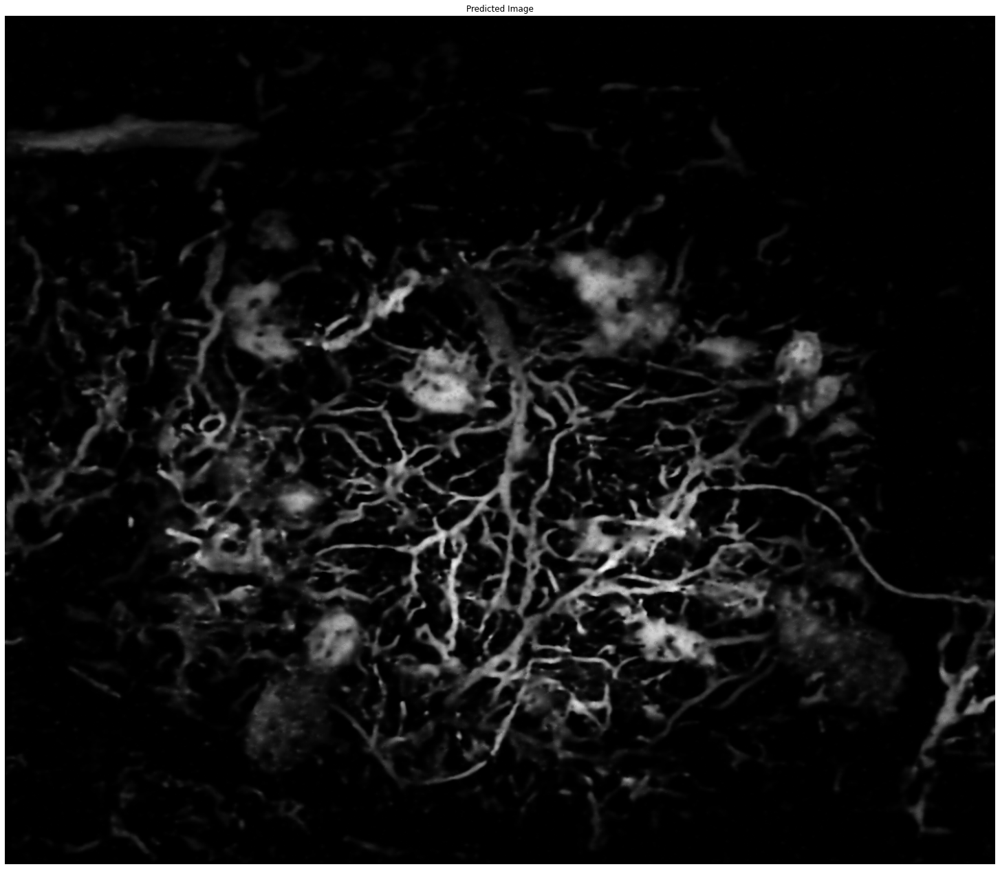

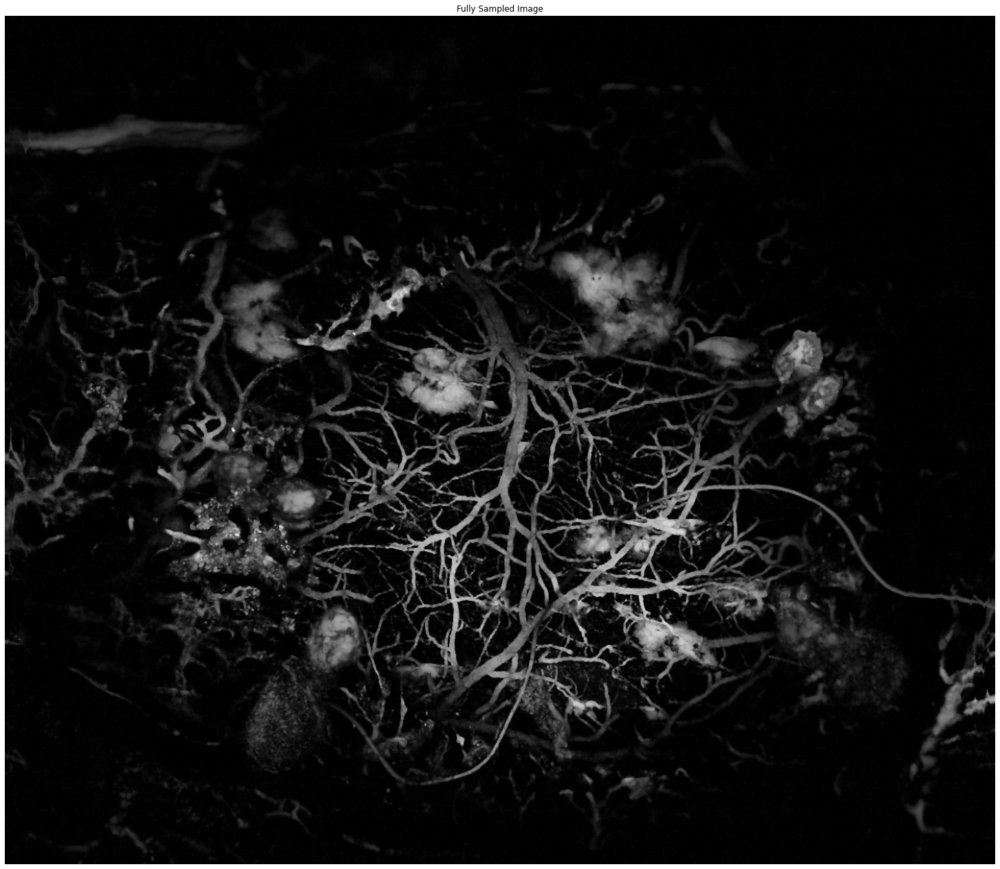

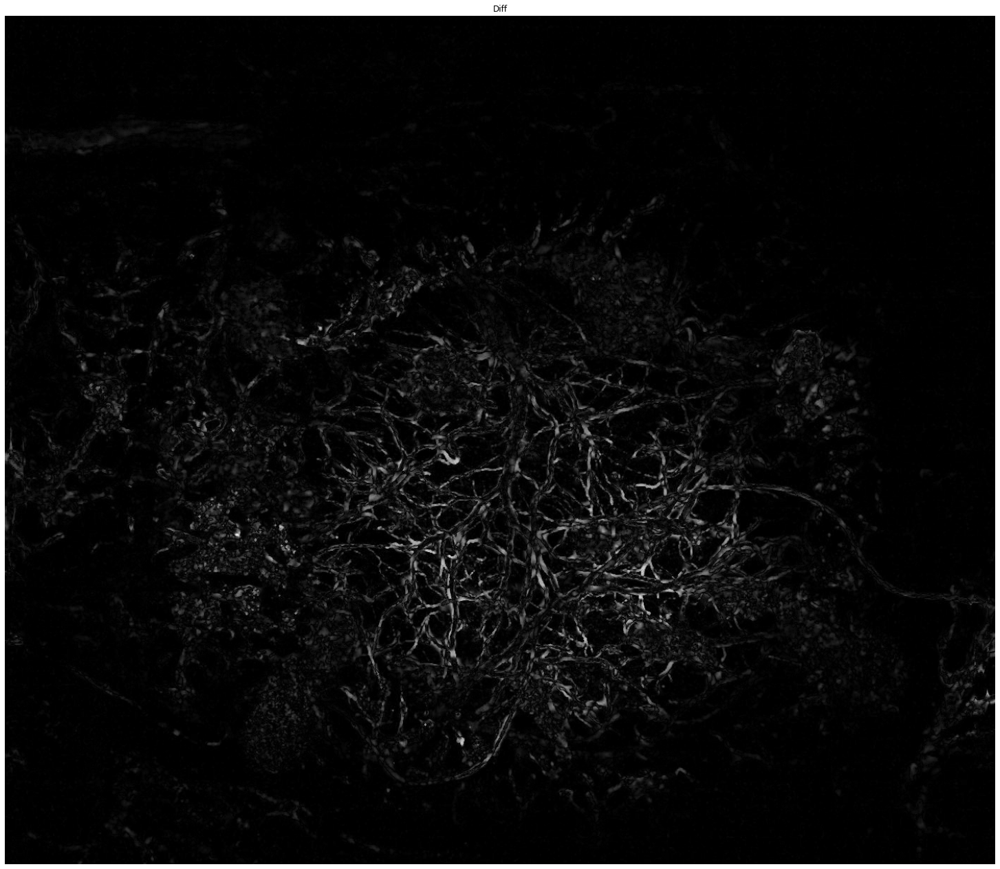

In [9]:
if DOWNSAMPLING_METHOD is 'random':
    img = next(iter(val_ds_down_zerofill_rand.shuffle(10000, seed=28)))
    fig_dir = os.path.join(FIG_DIR, input_dir)

    print(img.shape)
    orig_img = tf.pad(img, [[0, (np.ceil(img.shape[0]/32)*32 - img.shape[0]).astype(np.int32)], 
                            [0, (np.ceil(img.shape[1]/32)*32 - img.shape[1]).astype(np.int32)], 
                            [0,0]], "CONSTANT")
    print(orig_img.shape)
    pred = model.predict(orig_img[...,1][None,...,None])[0,...]
    pred = tf.image.crop_to_bounding_box(pred, 0, 0, img.shape[0], img.shape[1])
    pred = tf.clip_by_value(pred, 0, 1)
    orig_img = tf.image.crop_to_bounding_box(orig_img, 0, 0, img.shape[0], img.shape[1])

    print(f'MAE: {np.mean(np.abs(pred[...,0] - orig_img[...,0]))}')
    print(f'MSE: {np.mean((pred[...,0] - orig_img[...,0])**2)}')
    print(f'SSIM: {SSIM(pred[...,0][...,None], orig_img[...,0][...,None])}')
    print(f'PSNR: {PSNR(pred[...,0][...,None], orig_img[...,0][...,None])}')

    figsize = (20,20)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(pred[...,0], cmap = 'gray')
    if SAVE_OUTPUT: plt.savefig(fig_dir+'_pred_img_2.png', dpi=300, bbox_inches='tight',transparent=True, pad_inches=0)
    plt.title('Predicted Image')
    plt.show()
    figsize = (20,20)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(orig_img[...,0], cmap = 'gray')
    if SAVE_OUTPUT: plt.savefig(fig_dir+'_full_img_2.png', dpi=300, bbox_inches='tight',transparent=True, pad_inches=0)
    plt.title('Fully Sampled Image')
    plt.show()
    figsize = (20,20)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(np.abs(orig_img[...,0] - pred[...,0]), cmap = 'gray')
    if SAVE_OUTPUT: plt.savefig(fig_dir+'_diff_img_2.png', dpi=300, bbox_inches='tight',transparent=True, pad_inches=0)
    plt.title('Diff')
    plt.show()